<a href="https://colab.research.google.com/github/Sundaraselvamp/Project/blob/main/Vehicle_Detection_and_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
from google.colab.patches import cv2_imshow
import math
import cv2
import csv
import collections
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Your EuclideanDistTracker class
class EuclideanDistTracker:
    def __init__(self):
        # Store the center positions of the objects
        self.center_points = {}
        # Keep the count of the IDs
        # each time a new object id detected, the count will increase by one
        self.id_count = 0

    def update(self, objects_rect):
        # Objects boxes and ids
        objects_bbs_ids = []

        # Get center point of new object
        for rect in objects_rect:
            x, y, w, h, index = rect
            cx = (x + x + w) // 2
            cy = (y + y + h) // 2

            # Find out if that object was detected already
            same_object_detected = False
            for id, pt in self.center_points.items():
                dist = math.hypot(cx - pt[0], cy - pt[1])

                if dist < 25:
                    self.center_points[id] = (cx, cy)
                    objects_bbs_ids.append([x, y, w, h, id, index])
                    same_object_detected = True
                    break

            # New object is detected we assign the ID to that object
            if same_object_detected is False:
                self.center_points[self.id_count] = (cx, cy)
                objects_bbs_ids.append([x, y, w, h, self.id_count, index])
                self.id_count += 1

        # Clean the dictionary by center points to remove IDS not used anymore
        new_center_points = {}
        for obj_bb_id in objects_bbs_ids:
            _, _, _, _, object_id, index = obj_bb_id
            center = self.center_points[object_id]
            new_center_points[object_id] = center

        # Update dictionary with IDs not used removed
        self.center_points = new_center_points.copy()
        return objects_bbs_ids

In [3]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Initialize Tracker
tracker = EuclideanDistTracker()

# Initialize the image file path
image_file = '/content/drive/MyDrive/Vehicle Detection/traffic_img.jpg'  # Replace with your image file

# Detection confidence threshold
confThreshold = 0.2
nmsThreshold = 0.2

font_color = (0, 0, 255)
font_size = 0.5
font_thickness = 2


In [5]:
# Middle cross line position
middle_line_position = 225
up_line_position = middle_line_position - 15
down_line_position = middle_line_position + 15

In [6]:
# Store Coco Names in a list
classesFile = "/content/drive/MyDrive/Vehicle Detection/coco.names"
classNames = open(classesFile).read().strip().split('\n')
print(classNames)
print(len(classNames))

['person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'diningtable', 'toilet', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
80


In [7]:
# class index for our required detection classes
required_class_index = [2, 3, 5, 7]

detected_classNames = []

## Model Files
modelConfiguration = '/content/drive/MyDrive/Vehicle Detection/yolov3-320.cfg'
modelWeights = '/content/drive/MyDrive/Vehicle Detection/yolov3-320.weights'

In [8]:
# configure the network model
net = cv2.dnn.readNetFromDarknet(modelConfiguration, modelWeights)

# Configure the network backend
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

In [9]:
# Define random colour for each class
np.random.seed(42)
colors = np.random.randint(0, 255, size=(len(classNames), 3), dtype='uint8')

In [10]:
# Function for finding the center of a rectangle
def find_center(x, y, w, h):
    x1 = int(w/2)
    y1 = int(h/2)
    cx = x + x1
    cy = y + y1
    return cx, cy

In [11]:
# Function for count vehicle
def count_vehicle(box_id, img):
    x, y, w, h, id, index = box_id

    # Find the center of the rectangle for detection
    center = find_center(x, y, w, h)
    ix, iy = center

    # Find the current position of the vehicle
    if (iy > up_line_position) and (iy < middle_line_position):
        if id not in temp_up_list:
            temp_up_list.append(id)
    elif iy < down_line_position and iy > middle_line_position:
        if id not in temp_down_list:
            temp_down_list.append(id)
    elif iy < up_line_position:
        if id in temp_down_list:
            temp_down_list.remove(id)
            up_list[index] = up_list[index] + 1
    elif iy > down_line_position:
        if id in temp_up_list:
            temp_up_list.remove(id)
            down_list[index] = down_list[index] + 1

    # Draw circle in the middle of the rectangle
    cv2.circle(img, center, 2, (0, 0, 255), -1)


In [12]:
def post_process(outputs, img):
    global detected_classNames
    height, width = img.shape[:2]
    boxes = []
    classIds = []
    confidence_scores = []
    detection = []
    for output in outputs:
        for det in output:
            scores = det[5:]
            classId = np.argmax(scores)
            confidence = scores[classId]
            if classId in required_class_index:
                if confidence > confThreshold:
                    w, h = int(det[2]*width), int(det[3]*height)
                    x, y = int((det[0]*width)-w/2), int((det[1]*height)-h/2)
                    boxes.append([x, y, w, h])
                    classIds.append(classId)
                    confidence_scores.append(float(confidence))

    # Apply Non-Max Suppression
    indices = cv2.dnn.NMSBoxes(boxes, confidence_scores, confThreshold, nmsThreshold)
    for i in indices.flatten():
        x, y, w, h = boxes[i][0], boxes[i][1], boxes[i][2], boxes[i][3]

        color = [int(c) for c in colors[classIds[i]]]
        name = classNames[classIds[i]]
        detected_classNames.append(name)

        # Draw classname and confidence score
        cv2.putText(img, f'{name.upper()} {int(confidence_scores[i]*100)}%',
                    (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

        # Draw bounding rectangle
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 1)
        detection.append([x, y, w, h, required_class_index.index(classIds[i])])

    # Update the tracker for each object
    boxes_ids = tracker.update(detection)
    for box_id in boxes_ids:
        count_vehicle(box_id, img)


In [13]:
def from_static_image(image):
    img = cv2.imread(image)

    input_size = 320
    blob = cv2.dnn.blobFromImage(img, 1 / 255, (input_size, input_size), [0, 0, 0], 1, crop=False)

    # Set the input of the network
    net.setInput(blob)
    layersNames = net.getLayerNames()
    outputNames = [(layersNames[i - 1]) for i in net.getUnconnectedOutLayers()]
    # Feed data to the network
    outputs = net.forward(outputNames)

    # Find the objects from the network output
    post_process(outputs, img)

    # Count the frequency of detected classes
    frequency = collections.Counter(detected_classNames)
    print(frequency)

    # Draw counting texts in the frame
    cv2.putText(img, "Car:        "+str(frequency['car']), (20, 40), cv2.FONT_HERSHEY_SIMPLEX, font_size, font_color, font_thickness)
    cv2.putText(img, "Motorbike:  "+str(frequency['motorbike']), (20, 60), cv2.FONT_HERSHEY_SIMPLEX, font_size, font_color, font_thickness)
    cv2.putText(img, "Bus:        "+str(frequency['bus']), (20, 80), cv2.FONT_HERSHEY_SIMPLEX, font_size, font_color, font_thickness)
    cv2.putText(img, "Truck:      "+str(frequency['truck']), (20, 100), cv2.FONT_HERSHEY_SIMPLEX, font_size, font_color, font_thickness)

    # Display the image using cv2_imshow
    cv2_imshow(img)

    # Save the data to a csv file
    csv_file_path = '/content/drive/MyDrive/Vehicle Detection/static-data.csv'
    with open(csv_file_path, 'a') as f1:
        cwriter = csv.writer(f1)
        cwriter.writerow([image, frequency['car'], frequency['motorbike'], frequency['bus'], frequency['truck']])
    f1.close()

Counter({'car': 35, 'bus': 5, 'truck': 2})


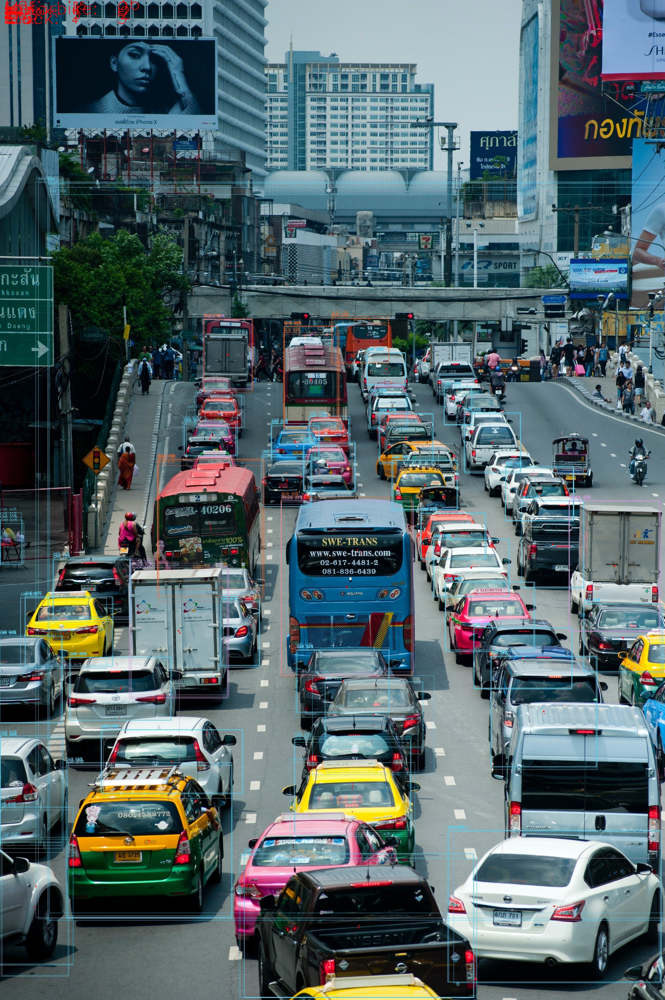

In [14]:
temp_up_list = []
temp_down_list = []
up_list = [0, 0, 0, 0]
down_list = [0, 0, 0, 0]

image_file = '/content/drive/MyDrive/Vehicle Detection/traffic_img.jpg'
detected_classNames = []  # Reset the list for each image
from_static_image(image_file)